In [35]:
import pandas as pd
import numpy as np
from matplotlib.ticker import LogFormatter
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import json
import plategig
import re

PROJECT_PATH = Path('/project/greencenter/Toprak_lab/shared/plategig/projects')
PROJECT_ID = '241011_Adam'

#### Step 1: Read Plate Information

In [36]:
# Read the Excel file into a DataFrame
df_plate_info = pd.read_excel(PROJECT_PATH / PROJECT_ID / 'data' / 'PlateInfo.xlsx', engine='openpyxl')
df_plate_info

,Experiment,Plate,Well,Strain,Culture,Replicate,Antibiotic,Dose
0,1,1,A1,P,1.0,1.0,Levofloxacin,8.0
1,1,1,A2,P,1.0,1.0,Levofloxacin,4.0
2,1,1,A3,P,1.0,1.0,Levofloxacin,2.0
3,1,1,A4,P,1.0,1.0,Levofloxacin,1.0
4,1,1,A5,P,1.0,1.0,Levofloxacin,0.5
...,...,...,...,...,...,...,...,...
14587,3,4,H8,Media Only,NaN,NaN,NaN,NaN
14588,3,4,H9,Media Only,NaN,NaN,NaN,NaN
14589,3,4,H10,Media Only,NaN,NaN,NaN,NaN
14590,3,4,H11,Media Only,NaN,NaN,NaN,NaN


In [37]:
def calculate_plate_id(row):
    if row['Experiment'] == 1:
        return row['Plate']
    elif row['Experiment'] == 2:
        return row['Plate'] + 99
    elif row['Experiment'] == 3:
        return row['Plate'] + 148
    else:
        return None  # Handle other experiments if needed

# Step 2: Apply the function to each row in the DataFrame and create the new 'Plate_ID' column
df_plate_info['Plate_ID'] = df_plate_info.apply(calculate_plate_id, axis=1)

# Step 3: Display the updated DataFrame
print(df_plate_info.head())

   Experiment  Plate Well Strain  Culture  Replicate    Antibiotic  Dose  \
0           1      1   A1      P      1.0        1.0  Levofloxacin   8.0   
1           1      1   A2      P      1.0        1.0  Levofloxacin   4.0   
2           1      1   A3      P      1.0        1.0  Levofloxacin   2.0   
3           1      1   A4      P      1.0        1.0  Levofloxacin   1.0   
4           1      1   A5      P      1.0        1.0  Levofloxacin   0.5   

   Plate_ID  
0         1  
1         1  
2         1  
3         1  
4         1  


Collect unique plate IDs

unique_plate_ids, plate_numbers = growthlib.get_unique_plate_ids(df_plate_info)
unique_plate_ids

#### Step 2: Read the raw OD data

In [38]:
df_OD_raw = pd.read_excel(PROJECT_PATH / PROJECT_ID / 'data' /'ODFinal.xlsx')
# drop last nan column, fix to input mistake
df_OD_raw = df_OD_raw.iloc[:,:-1]
df_OD_raw.tail()

,Unnamed: 0,1,2,3,4,5,6,7,8,9,10,11,12,0.046414
1513,D,0.044,0.046,0.045,0.045,0.045,0.044,0.044,0.044,0.044,0.044,0.044,0.045,od600:600
1514,E,0.467,0.486,0.478,0.456,0.461,0.044,0.045,0.045,0.045,0.044,0.046,0.046,od600:600
1515,F,0.453,0.453,0.444,0.478,0.489,0.044,0.044,0.045,0.045,0.044,0.045,0.046,od600:600
1516,G,0.463,0.454,0.457,0.542,0.518,0.044,0.044,0.044,0.045,0.046,0.046,0.046,od600:600
1517,H,0.046,0.045,0.046,0.046,0.046,0.045,0.044,0.046,0.046,0.045,0.046,0.046,od600:600


In [39]:
df = plategig.static.convert_OD_plate_to_long(df_OD_raw, df_plate_info)
df

,Plate_ID,Well,OD,Row,Column
0,1,A1,0.053,1,1
1,1,A2,0.050,1,2
2,1,A3,0.051,1,3
3,1,A4,0.053,1,4
4,1,A5,0.057,1,5
...,...,...,...,...,...
14587,152,H8,0.046,8,8
14588,152,H9,0.046,8,9
14589,152,H10,0.045,8,10
14590,152,H11,0.046,8,11


Calculate median background of all plates to impute plates with missing media-only wells.

In [40]:
df_plate_info[df_plate_info['Strain']=='Media Only']

,Experiment,Plate,Well,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID
8208,1,33,E1,Media Only,NaN,NaN,NaN,NaN,33
8209,1,33,E2,Media Only,NaN,NaN,NaN,NaN,33
8210,1,33,E3,Media Only,NaN,NaN,NaN,NaN,33
8211,1,33,E4,Media Only,NaN,NaN,NaN,NaN,33
8212,1,33,E5,Media Only,NaN,NaN,NaN,NaN,33
...,...,...,...,...,...,...,...,...,...
14587,3,4,H8,Media Only,NaN,NaN,NaN,NaN,152
14588,3,4,H9,Media Only,NaN,NaN,NaN,NaN,152
14589,3,4,H10,Media Only,NaN,NaN,NaN,NaN,152
14590,3,4,H11,Media Only,NaN,NaN,NaN,NaN,152


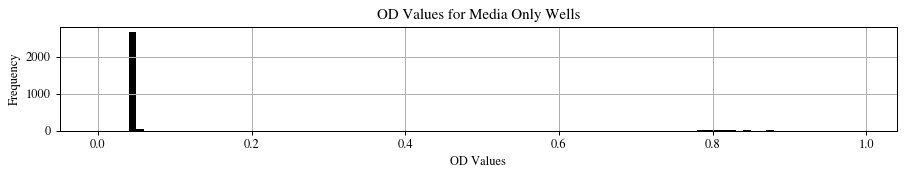

0.045


In [41]:

median_background_all_plates = plategig.static.calc_median_background_all_plates(
    df, df_plate_info, plot=True)
#I had to make these changes because there was a problem with the plate map info, confirm with Adam.
print(median_background_all_plates)

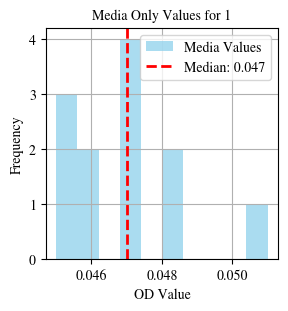

np.float64(0.047)

In [42]:
plategig.static.plot_single_plate_media_only_wells(df, df_plate_info, plate_id=1, column_name='OD')

Apply background correction for all plates

In [43]:
df_bc = df.copy()
df_bc['OD_final'] = df_bc['OD'] - median_background_all_plates

#### Evaluate growth metrics

In [44]:
df_bc

,Plate_ID,Well,OD,Row,Column,OD_final
0,1,A1,0.053,1,1,0.008
1,1,A2,0.050,1,2,0.005
2,1,A3,0.051,1,3,0.006
3,1,A4,0.053,1,4,0.008
4,1,A5,0.057,1,5,0.012
...,...,...,...,...,...,...
14587,152,H8,0.046,8,8,0.001
14588,152,H9,0.046,8,9,0.001
14589,152,H10,0.045,8,10,0.000
14590,152,H11,0.046,8,11,0.001


In [45]:
# Prep the analysis dataframe
df_analysis = pd.merge(df_plate_info, df_bc, on=['Plate_ID', 'Well'])
df_analysis = df_analysis[['Experiment','Strain', 'Culture', 'Replicate', 'Antibiotic',
                           'Dose', 'Plate_ID', 'Well', 'Row', 'Column',
                           'OD', 'OD_final']]
# Remove control wells
df_analysis = df_analysis[~df_analysis['Strain'].isin(['Media Only','Cells Only'])]
# Keep group names
df_analysis['Group'] = df_analysis.Strain
# Define each culture of as a separate strain
df_analysis['Strain'] = df_analysis.Strain + df_analysis.Culture.astype(int).astype(str)
df_analysis


,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
0,1,P1,1.0,1.0,Levofloxacin,8.000000,1,A1,1,1,0.053,0.008,P
1,1,P1,1.0,1.0,Levofloxacin,4.000000,1,A2,1,2,0.050,0.005,P
2,1,P1,1.0,1.0,Levofloxacin,2.000000,1,A3,1,3,0.051,0.006,P
3,1,P1,1.0,1.0,Levofloxacin,1.000000,1,A4,1,4,0.053,0.008,P
4,1,P1,1.0,1.0,Levofloxacin,0.500000,1,A5,1,5,0.057,0.012,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14542,3,ATEC-C-r1,1.0,3.0,Cefepime,0.062500,152,G1,7,1,0.463,0.418,ATEC-C-r
14543,3,ATEC-C-r1,1.0,3.0,Cefepime,0.031250,152,G2,7,2,0.454,0.409,ATEC-C-r
14544,3,ATEC-C-r1,1.0,3.0,Cefepime,0.015625,152,G3,7,3,0.457,0.412,ATEC-C-r
14545,3,ATEC-C-r1,1.0,3.0,Cefepime,0.007812,152,G4,7,4,0.542,0.497,ATEC-C-r


In [46]:
# TOdo:
# Remove some failed experiments:
# From experiment 1
#   ‘strain’ == ‘PAC’         (not used)
#   ‘strain’ == PCr             (range to small)
#   cultures == PLAC7 & PLAC10        (bad curve)
# From Experiment 2
#    ATEC 1,2,4     (plating error)
#    ATEC-C 3       (plating error)
#    ATEC-C-r        (plating error)
### Groups to remove
    # PAC
    # P
# Define the combinations of 'Experiment' and 'Group' to remove
df_analysis['Experiment'] = df_analysis['Experiment'].astype(str).str.strip()

groups_to_remove = [('1', 'PAC'), ('1', 'PCr')]

# Remove rows where the 'Experiment' and 'Group' match the combinations in groups_to_remove
df_analysis = df_analysis[~df_analysis[['Experiment', 'Group']].apply(tuple, axis=1).isin(groups_to_remove)]

# Define the combinations of 'Experiment' and 'Strain' to remove
strains_to_remove = [('1', 'PLAC7'), ('1', 'PLAC10')]

# Remove rows where the 'Experiment' and 'Strain' match the combinations in strains_to_remove
df_analysis = df_analysis[~df_analysis[['Experiment', 'Strain']].apply(tuple, axis=1).isin(strains_to_remove)]

# Define the combinations of 'Experiment' and 'Strain' to remove
atec_to_remove = [('2', 'ATEC-C-R', 'Cefepime'),('2', 'ATEC1', 'Cefepime'), ('2', 'ATEC2', 'Cefepime'), ('2', 'ATEC4', 'Cefepime'), ('2', 'ATEC-C3', 'Cefepime')]

# Remove rows where the 'Experiment' and 'Strain' match the combinations in strains_to_remove
df_analysis = df_analysis[~df_analysis[['Experiment', 'Strain', 'Antibiotic']].apply(tuple, axis=1).isin(atec_to_remove)]

df_analysis




,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
0,1,P1,1.0,1.0,Levofloxacin,8.000000,1,A1,1,1,0.053,0.008,P
1,1,P1,1.0,1.0,Levofloxacin,4.000000,1,A2,1,2,0.050,0.005,P
2,1,P1,1.0,1.0,Levofloxacin,2.000000,1,A3,1,3,0.051,0.006,P
3,1,P1,1.0,1.0,Levofloxacin,1.000000,1,A4,1,4,0.053,0.008,P
4,1,P1,1.0,1.0,Levofloxacin,0.500000,1,A5,1,5,0.057,0.012,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14542,3,ATEC-C-r1,1.0,3.0,Cefepime,0.062500,152,G1,7,1,0.463,0.418,ATEC-C-r
14543,3,ATEC-C-r1,1.0,3.0,Cefepime,0.031250,152,G2,7,2,0.454,0.409,ATEC-C-r
14544,3,ATEC-C-r1,1.0,3.0,Cefepime,0.015625,152,G3,7,3,0.457,0.412,ATEC-C-r
14545,3,ATEC-C-r1,1.0,3.0,Cefepime,0.007812,152,G4,7,4,0.542,0.497,ATEC-C-r


In [47]:
unique_groups = df_analysis['Group'].unique().tolist()
print(unique_groups)

['P', 'PA', 'PC', 'PL', 'PLA', 'PLAC', 'PCr', 'ATEC', 'ATEC-C', 'ATEC-C-r']


In [48]:
# Select subgroups
df_analysis = df_analysis.query("Group.isin(['P','PL','PLA','PLAC'])")
df_analysis

,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
0,1,P1,1.0,1.0,Levofloxacin,8.000000,1,A1,1,1,0.053,0.008,P
1,1,P1,1.0,1.0,Levofloxacin,4.000000,1,A2,1,2,0.050,0.005,P
2,1,P1,1.0,1.0,Levofloxacin,2.000000,1,A3,1,3,0.051,0.006,P
3,1,P1,1.0,1.0,Levofloxacin,1.000000,1,A4,1,4,0.053,0.008,P
4,1,P1,1.0,1.0,Levofloxacin,0.500000,1,A5,1,5,0.057,0.012,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11946,2,PLAC10,10.0,3.0,Cefepime,0.062500,133,G7,7,7,0.309,0.264,PLAC
11947,2,PLAC10,10.0,3.0,Cefepime,0.031250,133,G8,7,8,0.546,0.501,PLAC
11948,2,PLAC10,10.0,3.0,Cefepime,0.015625,133,G9,7,9,0.294,0.249,PLAC
11949,2,PLAC10,10.0,3.0,Cefepime,0.007812,133,G10,7,10,0.495,0.450,PLAC


In [49]:
### Double check
unique_columns = df_analysis.columns.tolist()

# Print the list of unique columns
print(unique_columns)

#
unique_values = df_analysis['Strain'].unique()

# Print the unique values
print(unique_values)

['Experiment', 'Strain', 'Culture', 'Replicate', 'Antibiotic', 'Dose', 'Plate_ID', 'Well', 'Row', 'Column', 'OD', 'OD_final', 'Group']
['P1' 'P2' 'P3' 'P4' 'P5' 'P6' 'P7' 'P8' 'P9' 'P10' 'PL1' 'PL2' 'PL3'
 'PL4' 'PL5' 'PL6' 'PL7' 'PL8' 'PL9' 'PL10' 'PLA1' 'PLA2' 'PLA3' 'PLA4'
 'PLA5' 'PLA6' 'PLA7' 'PLA8' 'PLA9' 'PLA10' 'PLAC1' 'PLAC2' 'PLAC3'
 'PLAC4' 'PLAC5' 'PLAC6' 'PLAC8' 'PLAC9' 'PLAC7' 'PLAC10']


In [50]:
antibiotics = df_analysis['Antibiotic'].unique()
antibiotics 

array(['Levofloxacin', 'Amikacin', 'Cefepime'], dtype=object)

In [51]:
df_analysis.query("Antibiotic == 'Levofloxacin' & Strain == 'P1'")

,Experiment,Strain,Culture,Replicate,Antibiotic,Dose,Plate_ID,Well,Row,Column,OD,OD_final,Group
0,1,P1,1.0,1.0,Levofloxacin,8.000000,1,A1,1,1,0.053,0.008,P
1,1,P1,1.0,1.0,Levofloxacin,4.000000,1,A2,1,2,0.050,0.005,P
2,1,P1,1.0,1.0,Levofloxacin,2.000000,1,A3,1,3,0.051,0.006,P
3,1,P1,1.0,1.0,Levofloxacin,1.000000,1,A4,1,4,0.053,0.008,P
4,1,P1,1.0,1.0,Levofloxacin,0.500000,1,A5,1,5,0.057,0.012,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9535,2,P1,1.0,3.0,Levofloxacin,0.062500,100,D8,4,8,0.061,0.016,P
9536,2,P1,1.0,3.0,Levofloxacin,0.031250,100,D9,4,9,0.125,0.080,P
9537,2,P1,1.0,3.0,Levofloxacin,0.015625,100,D10,4,10,0.441,0.396,P
9538,2,P1,1.0,3.0,Levofloxacin,0.007812,100,D11,4,11,0.541,0.496,P


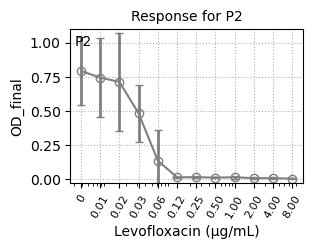

In [18]:

# Adjust the figure size as needed
fig, ax = plt.subplots(figsize=(3, 2))
plategig.static.plot_dose_response_curve_errorbar(df_analysis, 'P2', 'Levofloxacin', strain_colors={'P1':'black'}, ax=ax)

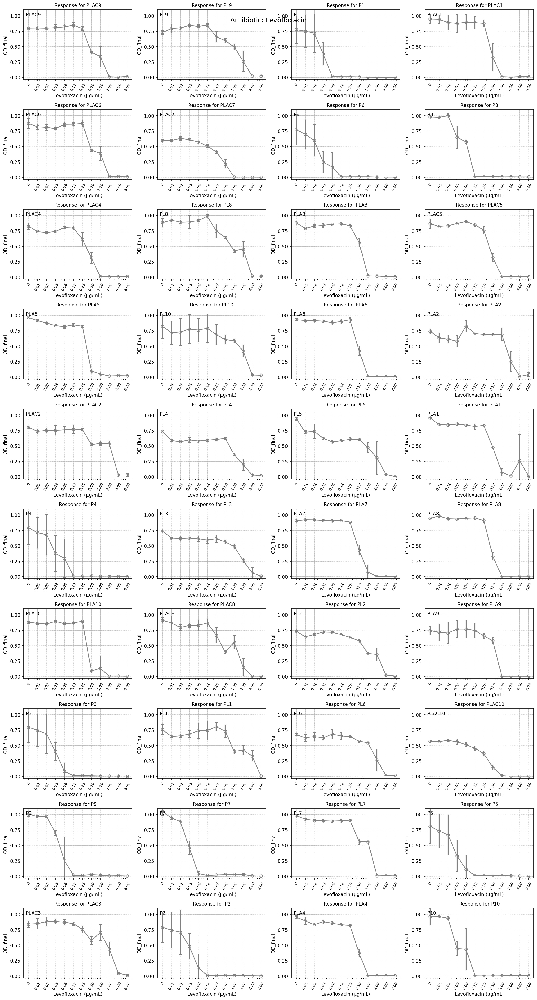

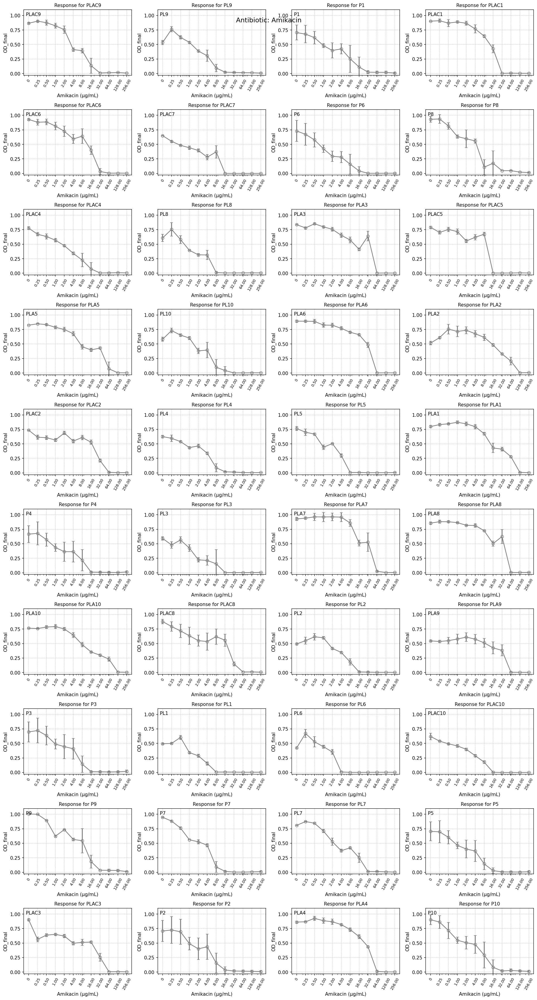

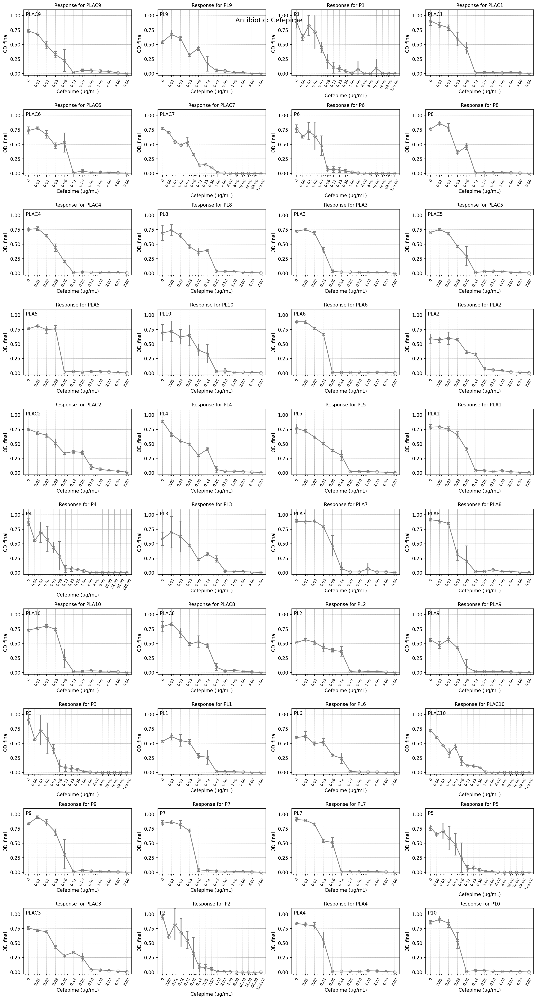

In [19]:
# Plot all dose-response curves in the df_analysis tables (might take too long)
for drug in antibiotics:
    if not pd.isna(drug):
        plategig.static.plot_od_final_for_selected_antibiotic(
            df_analysis,
            plategig.static.plot_dose_response_curve_errorbar,
            drug,
            strain_colors={})

In [52]:
valid_combinations = plategig.static.prep_valid_combinations(
    df_analysis,
    multiplex=['Strain', 'Antibiotic'],
    ic50_threshold=0.5,
    mic_threshold=0.05)
valid_combinations

,Strain,Antibiotic
0,P1,Levofloxacin
1,P2,Levofloxacin
2,P3,Levofloxacin
3,P4,Levofloxacin
4,P5,Levofloxacin
...,...,...
115,PLAC10,Levofloxacin
116,PLAC7,Amikacin
117,PLAC10,Amikacin
118,PLAC7,Cefepime


In [53]:
growth_features = plategig.static.apply_phenotyper(df_analysis, valid_combinations)
growth_features = plategig.static.cap_growth_features_within_experiment_range(growth_features)
growth_features

,Strain,Antibiotic,Status,IC50,MIC,IC50_ci_lower,IC50_ci_upper,MIC_ci_lower,MIC_ci_upper,max_growth,hill_coeff,ic50_threshold,mic_threshold,x_fit,y_fit,ic50_bootstrap,insufficient_drug
0,P1,Levofloxacin,PASS,0.030756,0.063292,0.022325,0.034540,0.033828,0.111584,0.7805,4.079989,0.39025,0.039025,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7803278448251768, 0.7802574766670972, 0.780...","[0.03117134975862426, 0.028746942483116086, 0....",False
1,P2,Levofloxacin,PASS,0.035086,0.103268,0.024528,0.045530,0.034902,0.231024,0.8055,2.727527,0.40275,0.040275,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.8034833754668613, 0.8029656392742125, 0.802...","[0.033733859846869434, 0.0281092182415157, 0.0...",False
2,P3,Levofloxacin,PASS,0.031816,0.082003,0.024494,0.037378,0.034242,0.162944,0.7755,3.109950,0.38775,0.038775,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7743620276035422, 0.7740228696495413, 0.773...","[0.03183848027753788, 0.033517701901134754, 0....",False
3,P4,Levofloxacin,PASS,0.039581,0.163157,0.024190,0.062456,0.033966,0.326421,0.7405,2.078856,0.37025,0.037025,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7345397846119063, 0.7334132084270468, 0.732...","[0.04171811672211747, 0.04267832561983741, 0.0...",False
4,P5,Levofloxacin,PASS,0.030621,0.076035,0.021514,0.042966,0.033268,0.176958,0.7310,3.237371,0.36550,0.036550,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7300703185192482, 0.7297802008908276, 0.729...","[0.031818082177287176, 0.024972003878340945, 0...",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,PLAC10,Levofloxacin,PASS,0.295989,1.314006,0.265866,0.327617,1.040219,1.586787,0.5735,1.975452,0.28675,0.028675,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.5733889401048112, 0.573368893773247, 0.5733...","[0.2984396675829516, 0.2818543062107152, 0.279...",False
116,PLAC7,Amikacin,PASS,3.747850,63.000200,3.223887,4.413129,47.409607,85.737008,0.6060,1.043404,0.30300,0.030300,"[0.125, 0.13595603716939894, 0.147872352342455...","[0.5890496793353928, 0.5875439575516729, 0.585...","[4.297015221678386, 3.848017997452155, 3.66163...",False
117,PLAC10,Amikacin,PASS,3.728669,29.175406,3.497493,3.980331,25.633510,33.570155,0.5625,1.431233,0.28125,0.028125,"[0.125, 0.13595603716939894, 0.147872352342455...","[0.5581727690629025, 0.5576246376800607, 0.557...","[3.6987727218005753, 3.7692404744635626, 3.705...",False
118,PLAC7,Cefepime,PASS,0.047778,0.957052,0.043093,0.053308,0.840451,1.079971,0.7415,0.982369,0.37075,0.037075,"[0.0019531249999999996, 0.0021999968474195166,...","[0.7107601835778946, 0.7071240699468381, 0.703...","[0.04480501040488467, 0.046998293264735376, 0....",False


In [54]:
growth_features['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])
growth_features

,Strain,Antibiotic,Status,IC50,MIC,IC50_ci_lower,IC50_ci_upper,MIC_ci_lower,MIC_ci_upper,max_growth,hill_coeff,ic50_threshold,mic_threshold,x_fit,y_fit,ic50_bootstrap,insufficient_drug,group
0,P1,Levofloxacin,PASS,0.030756,0.063292,0.022325,0.034540,0.033828,0.111584,0.7805,4.079989,0.39025,0.039025,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7803278448251768, 0.7802574766670972, 0.780...","[0.03117134975862426, 0.028746942483116086, 0....",False,P
1,P2,Levofloxacin,PASS,0.035086,0.103268,0.024528,0.045530,0.034902,0.231024,0.8055,2.727527,0.40275,0.040275,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.8034833754668613, 0.8029656392742125, 0.802...","[0.033733859846869434, 0.0281092182415157, 0.0...",False,P
2,P3,Levofloxacin,PASS,0.031816,0.082003,0.024494,0.037378,0.034242,0.162944,0.7755,3.109950,0.38775,0.038775,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7743620276035422, 0.7740228696495413, 0.773...","[0.03183848027753788, 0.033517701901134754, 0....",False,P
3,P4,Levofloxacin,PASS,0.039581,0.163157,0.024190,0.062456,0.033966,0.326421,0.7405,2.078856,0.37025,0.037025,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7345397846119063, 0.7334132084270468, 0.732...","[0.04171811672211747, 0.04267832561983741, 0.0...",False,P
4,P5,Levofloxacin,PASS,0.030621,0.076035,0.021514,0.042966,0.033268,0.176958,0.7310,3.237371,0.36550,0.036550,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.7300703185192482, 0.7297802008908276, 0.729...","[0.031818082177287176, 0.024972003878340945, 0...",False,P
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,PLAC10,Levofloxacin,PASS,0.295989,1.314006,0.265866,0.327617,1.040219,1.586787,0.5735,1.975452,0.28675,0.028675,"[0.00390625, 0.004248626161543717, 0.004621011...","[0.5733889401048112, 0.573368893773247, 0.5733...","[0.2984396675829516, 0.2818543062107152, 0.279...",False,PLAC
116,PLAC7,Amikacin,PASS,3.747850,63.000200,3.223887,4.413129,47.409607,85.737008,0.6060,1.043404,0.30300,0.030300,"[0.125, 0.13595603716939894, 0.147872352342455...","[0.5890496793353928, 0.5875439575516729, 0.585...","[4.297015221678386, 3.848017997452155, 3.66163...",False,PLAC
117,PLAC10,Amikacin,PASS,3.728669,29.175406,3.497493,3.980331,25.633510,33.570155,0.5625,1.431233,0.28125,0.028125,"[0.125, 0.13595603716939894, 0.147872352342455...","[0.5581727690629025, 0.5576246376800607, 0.557...","[3.6987727218005753, 3.7692404744635626, 3.705...",False,PLAC
118,PLAC7,Cefepime,PASS,0.047778,0.957052,0.043093,0.053308,0.840451,1.079971,0.7415,0.982369,0.37075,0.037075,"[0.0019531249999999996, 0.0021999968474195166,...","[0.7107601835778946, 0.7071240699468381, 0.703...","[0.04480501040488467, 0.046998293264735376, 0....",False,PLAC


In [56]:
strains = list(set(df_analysis['Strain'].str.lower()) - set(['media only', 'cells only', np.nan]))
print(strains)

['plac1', 'pl10', 'plac9', 'pla2', 'plac7', 'pla9', 'p2', 'pla5', 'plac3', 'p7', 'plac4', 'pl4', 'pl1', 'plac5', 'pl8', 'p1', 'pla1', 'p5', 'pla8', 'plac10', 'pl9', 'p4', 'pla3', 'pla10', 'p9', 'p10', 'plac6', 'p3', 'pl7', 'p8', 'pla6', 'plac8', 'p6', 'pl5', 'pla4', 'plac2', 'pl6', 'pla7', 'pl2', 'pl3']


In [24]:
antibiotics = list(set(df_analysis['Antibiotic'].str.lower()) - set(['media only', 'cells only', np.nan]))
antibiotics

['levofloxacin', 'amikacin', 'cefepime']

In [57]:
strain_colors = {strain:color for strain, color in zip(strains, sns.color_palette('muted')[:len(strains)])}


In [25]:
num_drugs = growth_features['Antibiotic'].nunique()
num_experiments = growth_features.shape[0]
num_cols = 6
num_rows = num_experiments//num_cols + (num_experiments % num_cols > 0)
# num_cols = num_experiments//num_drugs
# fig, axes = plt.subplots(num_experiments//num_replicates, num_replicates,
#                        figsize=(num_replicates*3, num_experiments*2), dpi=90)
fig, axes = plt.subplots(num_rows, num_cols,
                       figsize=(num_cols*3, num_rows*2), dpi=300)

for ix, row in growth_features.iterrows():
    plategig.static.plot_dose_response_curve_fit(df_analysis,
                                                growth_features=growth_features,
                                                strain_colors=strain_colors,
                                                strain=row['Strain'],
                                                antibiotic=row['Antibiotic'],
                                                ax=axes.flat[ix])
    
    if row['Status'] == 'FAIL':
        axes.flat[ix].text(0.5, 0.5, f'FAIL', color='red', fontsize=12, fontweight='bold',
                        ha='center', va='center', transform=axes.flat[ix].transAxes)
        # gray out the entire axes
        axes.flat[ix].set_facecolor('lightgray')
    if ix % num_cols != 0:
        axes.flat[ix].set_yticklabels([])
# Hide the rest of the axes
for ix in range(num_experiments, num_cols*num_rows):
    axes.flat[ix].axis('off')
    
fig.tight_layout()
# set empty space between subplots
fig.subplots_adjust(wspace=0.05)
fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'IC50 fits PLAC.png', dpi=300, bbox_inches='tight')

In [58]:
unique_columns = growth_features.columns.unique()
print(unique_columns)

Index(['Strain', 'Antibiotic', 'Status', 'IC50', 'MIC', 'IC50_ci_lower',
       'IC50_ci_upper', 'MIC_ci_lower', 'MIC_ci_upper', 'max_growth',
       'hill_coeff', 'ic50_threshold', 'mic_threshold', 'x_fit', 'y_fit',
       'ic50_bootstrap', 'insufficient_drug', 'group'],
      dtype='object')


In [27]:
#### Graphes the IC50 values for each with a confindence interval
    ### looks like it pulls growth_features

final_chart = alt.vconcat()
for drug in sorted(growth_features['Antibiotic'].unique()):
    select_cols = ['Strain','Antibiotic','Status','IC50','IC50_ci_lower','IC50_ci_upper', 'insufficient_drug']
    filtered_growth_features = growth_features[select_cols]
    filtered_growth_features = filtered_growth_features.query(f'Antibiotic == "{drug}" & Status == "PASS"')
    filtered_growth_features['StrainGroup'] = filtered_growth_features['Strain'].str.extract(r'(\D+)')

    base = alt.Chart(filtered_growth_features).encode(
        x='Strain',
    ).properties(width=700, height=300)

    ic50 = base.encode(
        y=alt.Y('IC50:Q', scale=alt.Scale(type="log")),
        color=alt.Color("StrainGroup:N")
    ).mark_point(filled=True, size=200)

    error_bars = base.mark_errorbar(ticks=True, size=10, thickness=2).encode(
        alt.Y("IC50_ci_lower:Q", scale=alt.Scale(type="log")).title('IC50'),
        alt.Y2("IC50_ci_upper:Q"),
        color='StrainGroup'
    )

    # Create a dagger symbol on the bars with insufficient_drug flag is true
    dagger = base.mark_text(align='center', baseline='middle', fontSize=14, color='black', fontWeight='bold', dy=-20, dx=0).encode(
        y=alt.Y('IC50'),
        text=alt.condition(
            alt.datum.insufficient_drug, if_true=alt.value("‡"), if_false=alt.value("")
            )
    )

    layered_chart = alt.layer(ic50, error_bars, dagger).properties(title=drug)
    final_chart &= layered_chart

final_chart = final_chart.resolve_scale(y='independent', x='independent').configure_axis(
    labelFontSize=18,
    titleFontSize=18,
).configure_title(
    fontSize=18,
    anchor='middle',
).configure_legend(
    titleFontSize=18,
    labelFontSize=18,
    symbolLimit=50,
)

final_chart = final_chart.configure_title(anchor='middle')
final_chart.save(PROJECT_PATH / PROJECT_ID / 'figures' / f'IC50 combined PLAC.png', scale_factor=2)
final_chart.show()

alt.VConcatChart(...)

Order of strains to be plotted:
['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'PLAC7', 'PLAC10', 'PLAC7', 'PLAC10', 'PLAC7', 'PLAC10']


/tmp/ipykernel_41724/3680381024.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['StrainGroup'] = filtered_data['Strain'].str.extract(r'(\D+)')
/tmp/ipykernel_41724/3680381024.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['SortOrder'] = filtered_data.index
/tmp/ipykernel_41724/3680381024.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

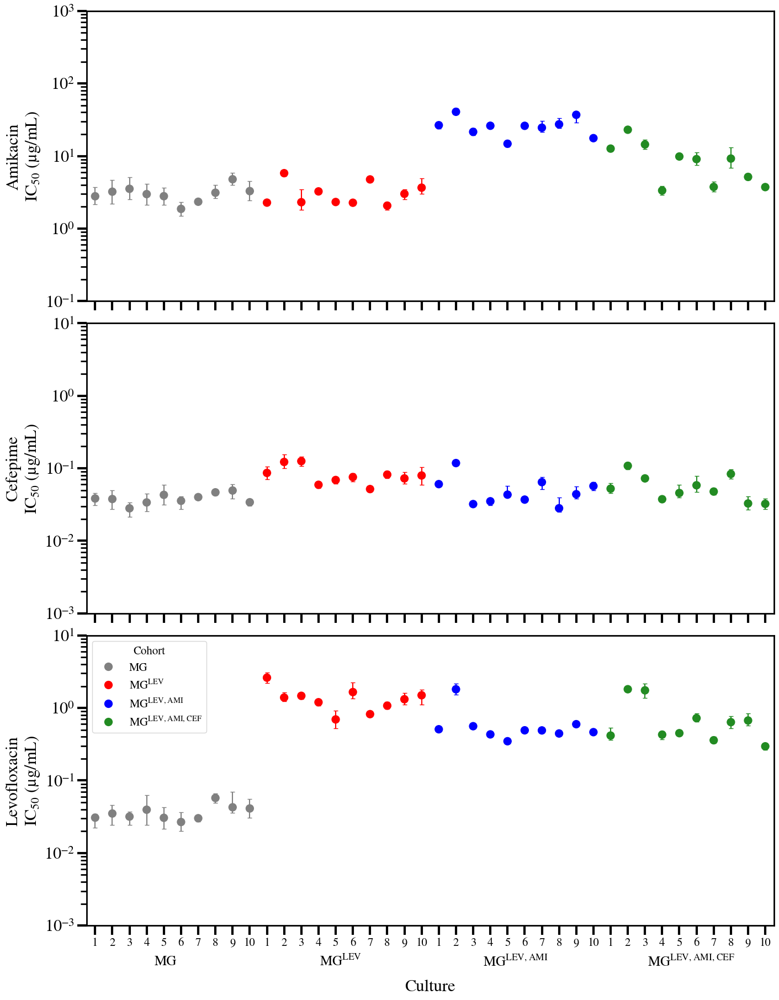

In [60]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

import re
manual_colors = {
    "P": "grey",
    "PLA": "blue",
    "PLAC": "forestgreen",
    "PL": "red"
}

def cohort_label(group):
    if group == "P":
        return "MG"
    elif group == "PL":
        return "MG$^{\\mathrm{LEV}}$"
    elif group == "PLA":
        return "MG$^{\\mathrm{LEV,AMI}}$"
    elif group == "PLAC":
        return "MG$^{\\mathrm{LEV,AMI,CEF}}$"
    else:
        return group  # Default to the original group name if no match
    

def custom_label(strain):
    # Match patterns for different strain types
    match = re.match(r'(P|PL|PLA|PLAC)(\d+)', strain)
    if match:
        prefix, number = match.groups()  # Extract group and number
        if prefix == "P":
            return f"MG-{number}"
        elif prefix == "PL":
            return f"MG$^{{\\mathrm{{LEV}}}}$-{number}"
        elif prefix == "PLA":
            return f"MG$^{{\\mathrm{{LEV,AMI}}}}$-{number}"
        elif prefix == "PLAC":
            return f"MG$^{{\\mathrm{{LEV,AMI,CEF}}}}$-{number}"
    # Default to the original strain label if no match
    return strain

print("Order of strains to be plotted:")
print(growth_features['Strain'].to_list())
# Dictionary of custom y-axis ranges for specific drugs
y_axis_ranges = {
    "Levofloxacin": (0.001, 10),
    "Amikacin": (.1, 1000),
    "Cefepime": (0.001, 10)
}

# Iterate over antibiotics to create subplots
fig, axes = plt.subplots(
    nrows=len(sorted(growth_features['Antibiotic'].unique())),
    figsize=(14, 18),
    constrained_layout=True
)

# Ensure axes is iterable even for a single plot
if len(sorted(growth_features['Antibiotic'].unique())) == 1:
    axes = [axes]

for ax, drug in zip(axes, sorted(growth_features['Antibiotic'].unique())):
    filtered_data = growth_features.query(f'Antibiotic == "{drug}" & Status == "PASS"')
    filtered_data['StrainGroup'] = filtered_data['Strain'].str.extract(r'(\D+)')

    # Add a sort key to maintain original strain order within the dataset
    filtered_data['SortOrder'] = filtered_data.index

    # Apply custom labels
    filtered_data['CustomLabel'] = filtered_data['Strain'].apply(custom_label)

    # Sort the labels numerically within groups, respecting original order
    filtered_data['NumericPart'] = filtered_data['Strain'].str.extract(r'(\d+)$').astype(int)
    filtered_data = filtered_data.sort_values(['StrainGroup', 'NumericPart', 'SortOrder'])

    # Extract values for plotting
    strains = filtered_data['CustomLabel']
    ic50 = filtered_data['IC50']
    ci_lower = filtered_data['IC50_ci_lower']
    ci_upper = filtered_data['IC50_ci_upper']
    insufficient_drug = filtered_data['insufficient_drug']
    strain_groups = filtered_data['StrainGroup']

    # Assign colors for each strain group
    unique_groups = strain_groups.unique()
    group_colors = {group: manual_colors.get(group, "black") for group in unique_groups}
    colors = strain_groups.map(group_colors)

    # Plot IC50 points
    scatter = ax.scatter(strains, ic50, color=colors, s=100, label=strain_groups)
    
    # Add error bars with matching colors
    for i, color in enumerate(colors):
        ax.errorbar(
            x=i,
            y=ic50.iloc[i],
            yerr=[[ic50.iloc[i] - ci_lower.iloc[i]], [ci_upper.iloc[i] - ic50.iloc[i]]],
            fmt='none',
            ecolor=color,
            capsize=3
        )

    # Add dagger annotations for insufficient drug
    for i, strain in enumerate(strains):
        if insufficient_drug.iloc[i]:
            ax.text(i, ic50.iloc[i] * 1.2, '‡', ha='center', va='bottom', fontsize=12, color='black')

    # Format the y-axis with log scale
    ax.set_yscale('log')
    
    # Apply custom y-axis range if the drug is in the dictionary
    if drug in y_axis_ranges:
        ax.set_ylim(y_axis_ranges[drug])

    ax.set_ylabel(f"{drug}\nIC$_{{50}}$ (μg/mL)", fontsize=22)
    ax.tick_params(axis='y', labelsize=22)  # Adjust 'labelsize' to your preferred size

    ax.set_xlim(-0.5, len(strains) - 0.5)  # Tighten edges by adding a small buffer
    
    for spine in ax.spines.values():
        spine.set_linewidth(2)  # Set thickness of the spine lines
    
    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks

    if drug == 'Levofloxacin':
        ax.set_xlabel('Culture', fontsize=22, labelpad=40)         
        # Calculate repeated labels
        repeated_labels = [str(i) for i in range(1, 11)] * (len(strains) // 10 + 1)
        repeated_labels = repeated_labels[:len(strains)]
        
        # Set xticks and xticklabels
        ax.set_xticks(range(len(strains)))
        ax.set_xticklabels(repeated_labels, fontsize=15)

        # Calculate unique cohort groups and their midpoints
        cohort_midpoints = []
        current_group = strain_groups.iloc[0]
        group_start = 0

        for i, group in enumerate(strain_groups):
            if group != current_group:
                midpoint = (group_start + i - 1) / 2
                cohort_midpoints.append((current_group, midpoint))
                group_start = i
                current_group = group
        
        # Add the last group
        midpoint = (group_start + len(strain_groups) - 1) / 2
        cohort_midpoints.append((current_group, midpoint))

        # Add cohort labels below the x-axis
        for group, midpoint in cohort_midpoints:
            ax.text(midpoint / len(strains)*1.02, -0.1, cohort_label(group), fontsize=18, 
                    ha='center', va='top', transform=ax.transAxes)

        # Create a legend with cohort labels
        handles = [plt.Line2D([0], [0], marker='o', color=color, markersize=10, linestyle='', 
                              label=cohort_label(group)) for group, color in group_colors.items()]
        ax.legend(handles=handles, title="Cohort", loc="upper left", fontsize=15, title_fontsize=15)

    else:
        ax.set_xticklabels("")  # Keep empty xticklabels for other subplots

final_chart_path = PROJECT_PATH / PROJECT_ID / 'figures'/'finals'/'0512_finals' / 'PLAC_IC50_individual.png'
plt.savefig(final_chart_path, dpi=600, bbox_inches='tight')
plt.show()
# Show plot
plt.show()


Order of strains to be plotted:
['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'PL1', 'PL2', 'PL3', 'PL4', 'PL5', 'PL6', 'PL7', 'PL8', 'PL9', 'PL10', 'PLA1', 'PLA2', 'PLA3', 'PLA4', 'PLA5', 'PLA6', 'PLA7', 'PLA8', 'PLA9', 'PLA10', 'PLAC1', 'PLAC2', 'PLAC3', 'PLAC4', 'PLAC5', 'PLAC6', 'PLAC8', 'PLAC9', 'PLAC7', 'PLAC10', 'PLAC7', 'PLAC10', 'PLAC7', 'PLAC10']


/tmp/ipykernel_41724/3280701448.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['StrainGroup'] = filtered_data['Strain'].str.extract(r'(\D+)')
/tmp/ipykernel_41724/3280701448.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['SortOrder'] = filtered_data.index
/tmp/ipykernel_41724/3280701448.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docum

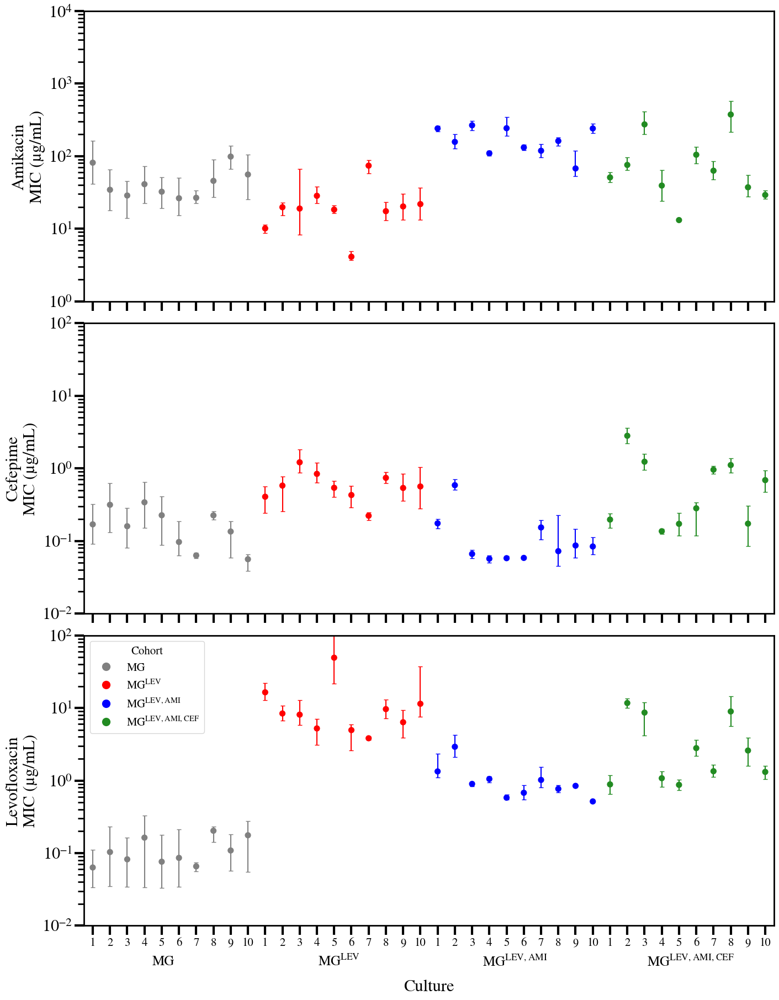

In [61]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

import re
manual_colors = {
    "P": "grey",
    "PLA": "blue",
    "PLAC": "forestgreen",
    "PL": "red"
}

def cohort_label(group):
    if group == "P":
        return "MG"
    elif group == "PL":
        return "MG$^{\\mathrm{LEV}}$"
    elif group == "PLA":
        return "MG$^{\\mathrm{LEV,AMI}}$"
    elif group == "PLAC":
        return "MG$^{\\mathrm{LEV,AMI,CEF}}$"
    else:
        return group  # Default to the original group name if no match
    
def custom_label(strain):
    # Match patterns for different strain types
    match = re.match(r'(P|PL|PLA|PLAC)(\d+)', strain)
    if match:
        prefix, number = match.groups()  # Extract group and number
        if prefix == "P":
            return f"MG-{number}"
        elif prefix == "PL":
            return f"MG$^{{\\mathrm{{LEV}}}}$-{number}"
        elif prefix == "PLA":
            return f"MG$^{{\\mathrm{{LEV,AMI}}}}$-{number}"
        elif prefix == "PLAC":
            return f"MG$^{{\\mathrm{{LEV,AMI,CEF}}}}$-{number}"
    # Default to the original strain label if no match
    return strain
print("Order of strains to be plotted:")
print(growth_features['Strain'].to_list())
# Dictionary of custom y-axis ranges for specific drugs
y_axis_ranges = {
    "Levofloxacin": (0.01, 100),
    "Amikacin": (1, 10000),
    "Cefepime": (0.01, 100)
}


# Iterate over antibiotics to create subplots
fig, axes = plt.subplots(
    nrows=len(sorted(growth_features['Antibiotic'].unique())),
    figsize=(14, 18),
    constrained_layout=True
)

# Ensure axes is iterable even for a single plot
if len(sorted(growth_features['Antibiotic'].unique())) == 1:
    axes = [axes]

for ax, drug in zip(axes, sorted(growth_features['Antibiotic'].unique())):
    filtered_data = growth_features.query(f'Antibiotic == "{drug}" & Status == "PASS"')
    filtered_data['StrainGroup'] = filtered_data['Strain'].str.extract(r'(\D+)')

    # Add a sort key to maintain original strain order within the dataset
    filtered_data['SortOrder'] = filtered_data.index

    # Apply custom labels
    filtered_data['CustomLabel'] = filtered_data['Strain'].apply(custom_label)

    # Sort the labels numerically within groups, respecting original order
    filtered_data['NumericPart'] = filtered_data['Strain'].str.extract(r'(\d+)$').astype(int)
    filtered_data = filtered_data.sort_values(['StrainGroup', 'NumericPart', 'SortOrder'])


    # Extract values for plotting
    strains = filtered_data['CustomLabel']
    mic50 = filtered_data['MIC']
    ci_lower = filtered_data['MIC_ci_lower']
    ci_upper = filtered_data['MIC_ci_upper']
    insufficient_drug = filtered_data['insufficient_drug']
    strain_groups = filtered_data['StrainGroup']

    # Assign colors for each strain group
    unique_groups = strain_groups.unique()
    group_colors = {group: manual_colors.get(group, "black") for group in unique_groups}
    colors = strain_groups.map(group_colors)

    # Plot IC50 points
    scatter = ax.scatter(strains, mic50, color=colors, s=50, label=strain_groups)
    
    # Add error bars with matching colors
    for i, color in enumerate(colors):
        ax.errorbar(
            x=i,
            y=mic50.iloc[i],
            yerr=[[mic50.iloc[i] - ci_lower.iloc[i]], [ci_upper.iloc[i] - mic50.iloc[i]]],
            fmt='none',
            ecolor=color,
            capsize=3
        )

    # Add dagger annotations for insufficient drug
    for i, strain in enumerate(strains):
        if insufficient_drug.iloc[i]:
            ax.text(i, mic50.iloc[i] * 1.2, '‡', ha='center', va='bottom', fontsize=12, color='black')

    # Format the y-axis with log scale
    ax.set_yscale('log')
    
    # Apply custom y-axis range if the drug is in the dictionary
    if drug in y_axis_ranges:
        ax.set_ylim(y_axis_ranges[drug])

    ax.set_ylabel(f"{drug}\nMIC (μg/mL)", fontsize=22)
    ax.tick_params(axis='y', labelsize=22)  # Adjust 'labelsize' to your preferred size

    ax.set_xlim(-0.5, len(strains) - 0.5)  # Tighten edges by adding a small buffer

    for spine in ax.spines.values():
        spine.set_linewidth(2)  # Set thickness of the spine lines


    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks

    if drug == 'Levofloxacin':
        ax.set_xlabel('Culture', fontsize=22, labelpad=40)         
        # Calculate repeated labels
        repeated_labels = [str(i) for i in range(1, 11)] * (len(strains) // 10 + 1)
        repeated_labels = repeated_labels[:len(strains)]
        
        # Set xticks and xticklabels
        ax.set_xticks(range(len(strains)))
        ax.set_xticklabels(repeated_labels, fontsize=15)

        # Calculate unique cohort groups and their midpoints
        cohort_midpoints = []
        current_group = strain_groups.iloc[0]
        group_start = 0

        for i, group in enumerate(strain_groups):
            if group != current_group:
                midpoint = (group_start + i - 1) / 2
                cohort_midpoints.append((current_group, midpoint))
                group_start = i
                current_group = group
        
        # Add the last group
        midpoint = (group_start + len(strain_groups) - 1) / 2
        cohort_midpoints.append((current_group, midpoint))

        # Add cohort labels below the x-axis
        for group, midpoint in cohort_midpoints:
            ax.text(midpoint / len(strains)*1.02, -0.1, cohort_label(group), fontsize=18, 
                    ha='center', va='top', transform=ax.transAxes)

        # Create a legend with cohort labels
        handles = [plt.Line2D([0], [0], marker='o', color=color, markersize=10, linestyle='', 
                              label=cohort_label(group)) for group, color in group_colors.items()]
        ax.legend(handles=handles, title="Cohort", loc="upper left", fontsize=15, title_fontsize=15)

    else:
        ax.set_xticklabels("")  # Keep empty xticklabels for other subplots

final_chart_path = PROJECT_PATH / PROJECT_ID / 'figures'/'finals'/'0512_finals' / 'PLAC_MIC50_individual.png'
plt.savefig(final_chart_path, dpi=600, bbox_inches='tight')
plt.show()
# Show plot
plt.show()


In [32]:
(
growth_features[['Antibiotic','Strain','Status','IC50','MIC','IC50_ci_lower','IC50_ci_upper', 'max_growth', 'hill_coeff']]
.to_csv(PROJECT_PATH / PROJECT_ID / 'figures' / f'IC50 estimations.csv',
          index=False)
)

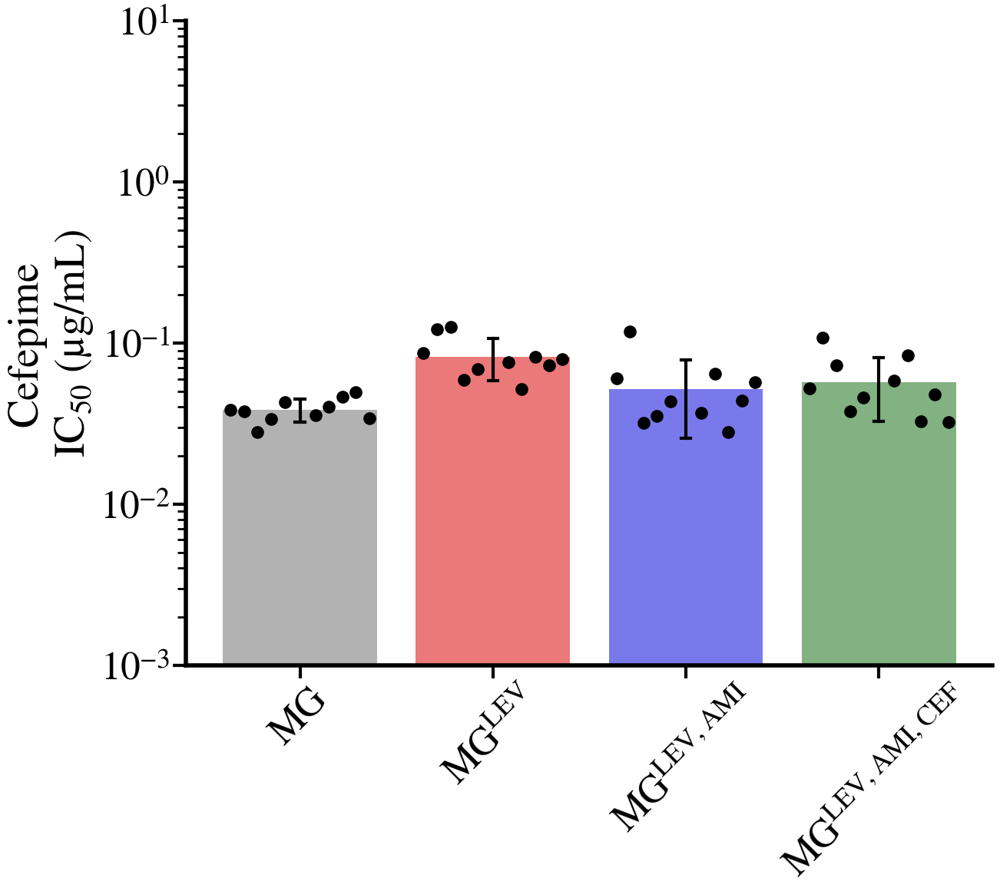

In [63]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

######### LABELS
# Assign the antibiotic you want to graph
selected_antibiotic = "Cefepime"

# Subset the data for the selected antibiotic
subset_data = growth_features[growth_features['Antibiotic'] == selected_antibiotic].copy()  # Avoid SettingWithCopyWarning

# Custom y-axis limits for each antibiotic
custom_y_limits = {
    "Levofloxacin": (0.001, 10),
    "Amikacin": (.1, 1000),
    "Cefepime": (0.001, 10)
}

# Create a new column for the updated group labels
def assign_group_label(row):
    if row['group'] == "P":
        return r"MG"  # Just MG
    elif row['group'] == "PLA":
        return r"MG$^{\mathrm{LEV,AMI}}$"  # MG with AMI as superscript
    elif row['group'] == "PLAC":
        return r"MG$^{\mathrm{LEV,AMI,CEF}}$"  # MG with CEF as superscript
    elif row['group'] == "PL":
        return r"MG$^{\mathrm{LEV}}$"  # MG with LEV as superscript
    else:
        return "Unknown"

# Ensure the 'group' column exists
if 'group' not in subset_data.columns:
    subset_data['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])

# Apply the function to create the new column
subset_data.loc[:, 'group_fancy'] = subset_data.apply(assign_group_label, axis=1)

# Update the palette to match the new group labels
group_palette = {
    r"MG": "grey",
    r"MG$^{\mathrm{LEV,AMI}}$": "blue",
    r"MG$^{\mathrm{LEV,AMI,CEF}}$": "forestgreen",
    r"MG$^{\mathrm{LEV}}$": "red",
}

# Use FacetGrid for plotting
g = sns.FacetGrid(
    subset_data,
    col="Antibiotic",  # Facet by Antibiotic
    sharey=False,  # Allow independent y-axis scaling
    height=10,  # Height of each facet
    aspect=1.5,  # Aspect ratio for width scaling
)

# Map bar plots to the grid
g.map(
    sns.barplot,
    "group_fancy",  # X-axis
    "IC50",  # Y-axis
    ci="sd",
    order=subset_data['group_fancy'].unique(),  # Ensure consistent x-axis order
    palette=group_palette,
    alpha=0.6,
    errcolor="black",  # Color of the error bars
    errwidth=3,  # Thickness of the error bars
    capsize=0.05  # Length of the caps on error bars
)

# Custom function to calculate evenly spaced x-positions
def get_evenly_spaced_positions(group_data, x_base, spread=0.36, gap=0.08):
    """
    Calculate evenly spaced x-positions around a central x_base, leaving a gap in the middle.

    Parameters:
        group_data: DataFrame containing points for a single category.
        x_base: Central x position for the category.
        spread: Maximum range to spread points around the center.
        gap: The size of the gap to leave in the middle (default: 0.1).

    Returns:
        List of adjusted x-positions for the points.
    """
    n_points = len(group_data)
    if n_points == 1:
        return [x_base]  # No need to spread if there's only one point

    half_points = n_points // 2  # Divide points into two halves
    if n_points % 2 == 0:
        # Even number of points
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        offsets = np.concatenate([left_offsets, right_offsets])
    else:
        # Odd number of points: one point stays at the center
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        center_offset = [0]  # Keep one point at the exact center
        offsets = np.concatenate([left_offsets, center_offset, right_offsets])

    return x_base + offsets

# Overlay strip plots with custom spacing
for group_fancy, group_data in subset_data.groupby('group_fancy'):
    x_base = subset_data['group_fancy'].unique().tolist().index(group_fancy)  # Base x position
    x_positions = get_evenly_spaced_positions(group_data, x_base)
    
    g.ax.scatter(
        x_positions,
        group_data['IC50'],
        color="black",
        facecolor="black",
        s=100,
        edgecolor="black",
        linewidth=2,
        zorder=10  # Ensure points are above other plot elements
    )


# Customizations for the y-axis and ticks
for ax in g.axes.flat:
    ax.set_yscale("log")  # Set log scale
    # Apply custom y-axis limits for the selected antibiotic
    if selected_antibiotic in custom_y_limits:
        ax.set_ylim(custom_y_limits[selected_antibiotic])
    # Let Seaborn/Matplotlib determine y-ticks automatically and just adjust their font size
    for label in ax.get_yticklabels():
        label.set_fontsize(37)  # Adjust font size for existing tick labels



 # Set x-tick positions and labels explicitly
    tick_positions = range(len(subset_data['group_fancy'].unique()))  # Create positions for each category
    ax.set_xticks(tick_positions)  # Set tick positions
    ax.set_xticklabels(subset_data['group_fancy'].unique(), rotation=45, ha="center", fontsize=37) 

    for spine in ax.spines.values():
        spine.set_linewidth(4)  # Set thickness of the sp

    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks


# Add axis labels and facet titles

g.set_axis_labels("", f"{selected_antibiotic}\nIC$_{{50}}$ (μg/mL)", fontsize=40)
g.set_titles("", size=50)  # Facet title uses the column value

# Adjust overall layout and spacing
g.fig.subplots_adjust(left=0.2, right=0.9, top=0.9, wspace=0.3, hspace=0.4)
g.fig.set_size_inches(15, 10)  # Total figure size

# Save the plot (optional)
#g.savefig(f"{selected_antibiotic}_IC50_plot_1127.png", dpi=300, bbox_inches="tight")
g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / 'finals'/'0512_finals'/ f"{selected_antibiotic}_PLAC_IC50_labels.png", dpi=600, bbox_inches="tight")
#g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'Cefepime_IC50_new', dpi=200, bbox_inches='tight')
# Show the plot
plt.show()


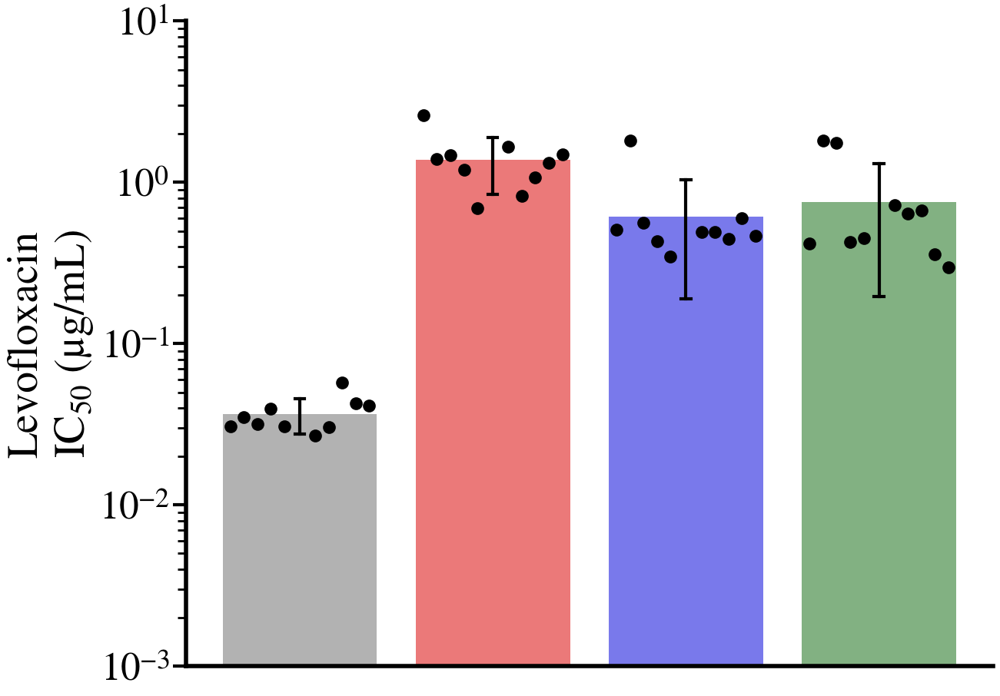

In [64]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

######### NO LABELS
# Assign the antibiotic you want to graph
selected_antibiotic = "Levofloxacin"

# Subset the data for the selected antibiotic
subset_data = growth_features[growth_features['Antibiotic'] == selected_antibiotic].copy()  # Avoid SettingWithCopyWarning

# Custom y-axis limits for each antibiotic
custom_y_limits = {
    "Levofloxacin": (0.001, 10),
    "Amikacin": (.1, 1000),
    "Cefepime": (0.001, 10)
}

# Create a new column for the updated group labels
def assign_group_label(row):
    if row['group'] == "P":
        return r"MG"  # Just MG
    elif row['group'] == "PLA":
        return r"MG$^{\mathrm{LEV,AMI}}$"  # MG with AMI as superscript
    elif row['group'] == "PLAC":
        return r"MG$^{\mathrm{LEV,AMI,CEF}}$"  # MG with CEF as superscript
    elif row['group'] == "PL":
        return r"MG$^{\mathrm{LEV}}$"  # MG with LEV as superscript
    else:
        return "Unknown"

# Ensure the 'group' column exists
if 'group' not in subset_data.columns:
    subset_data['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])

# Apply the function to create the new column
subset_data.loc[:, 'group_fancy'] = subset_data.apply(assign_group_label, axis=1)

# Update the palette to match the new group labels
group_palette = {
    r"MG": "grey",
    r"MG$^{\mathrm{LEV,AMI}}$": "blue",
    r"MG$^{\mathrm{LEV,AMI,CEF}}$": "forestgreen",
    r"MG$^{\mathrm{LEV}}$": "red",
}

# Use FacetGrid for plotting
g = sns.FacetGrid(
    subset_data,
    col="Antibiotic",  # Facet by Antibiotic
    sharey=False,  # Allow independent y-axis scaling
    height=10,  # Height of each facet
    aspect=1.5,  # Aspect ratio for width scaling
)

# Map bar plots to the grid
g.map(
    sns.barplot,
    "group_fancy",  # X-axis
    "IC50",  # Y-axis
    ci="sd",
    order=subset_data['group_fancy'].unique(),  # Ensure consistent x-axis order
    palette=group_palette,
    alpha=0.6,
    errcolor="black",  # Color of the error bars
    errwidth=3,  # Thickness of the error bars
    capsize=0.05  # Length of the caps on error bars
)

# Custom function to calculate evenly spaced x-positions
def get_evenly_spaced_positions(group_data, x_base, spread=0.36, gap=0.08):
    """
    Calculate evenly spaced x-positions around a central x_base, leaving a gap in the middle.

    Parameters:
        group_data: DataFrame containing points for a single category.
        x_base: Central x position for the category.
        spread: Maximum range to spread points around the center.
        gap: The size of the gap to leave in the middle (default: 0.1).

    Returns:
        List of adjusted x-positions for the points.
    """
    n_points = len(group_data)
    if n_points == 1:
        return [x_base]  # No need to spread if there's only one point

    half_points = n_points // 2  # Divide points into two halves
    if n_points % 2 == 0:
        # Even number of points
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        offsets = np.concatenate([left_offsets, right_offsets])
    else:
        # Odd number of points: one point stays at the center
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        center_offset = [0]  # Keep one point at the exact center
        offsets = np.concatenate([left_offsets, center_offset, right_offsets])

    return x_base + offsets

# Overlay strip plots with custom spacing
for group_fancy, group_data in subset_data.groupby('group_fancy'):
    x_base = subset_data['group_fancy'].unique().tolist().index(group_fancy)  # Base x position
    x_positions = get_evenly_spaced_positions(group_data, x_base)
    
    g.ax.scatter(
        x_positions,
        group_data['IC50'],
        color="black",
        facecolor="black",
        s=100,
        edgecolor="black",
        linewidth=2,
        zorder=10  # Ensure points are above other plot elements
    )


# Customizations for the y-axis and ticks
for ax in g.axes.flat:
    ax.set_yscale("log")  # Set log scale
    # Apply custom y-axis limits for the selected antibiotic
    if selected_antibiotic in custom_y_limits:
        ax.set_ylim(custom_y_limits[selected_antibiotic])
    # Let Seaborn/Matplotlib determine y-ticks automatically and just adjust their font size
    for label in ax.get_yticklabels():
        label.set_fontsize(37)  # Adjust font size for existing tick labels



 # Set x-tick positions and labels explicitly
    ax.set_xticks([])  # Remove tick positions
    ax.set_xticklabels([])  # Remove tick labels

    # Remove x-axis label
    ax.set_xlabel('')  # Remove x-axis label
    for spine in ax.spines.values():
        spine.set_linewidth(4)  # Set thickness of the spine lines

    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks


# Add axis labels and facet titles
g.set_axis_labels("", "", fontsize=40)
g.set_axis_labels("", f"{selected_antibiotic}\nIC$_{{50}}$ (μg/mL)", fontsize=40)
g.set_titles("", size=50)  # Facet title uses the column value

# Adjust overall layout and spacing
g.fig.subplots_adjust(left=0.2, right=0.9, top=0.9, wspace=0.3, hspace=0.4)
g.fig.set_size_inches(15, 10)  # Total figure size

# Save the plot (optional)
#g.savefig(f"{selected_antibiotic}_IC50_plot_1127.png", dpi=300, bbox_inches="tight")
g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures'/'finals'/'0512_finals' / f"{selected_antibiotic}_PLAC_IC50.png", dpi=600, bbox_inches="tight")
#g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'Cefepime_IC50_new', dpi=200, bbox_inches='tight')
# Show the plot
plt.show()


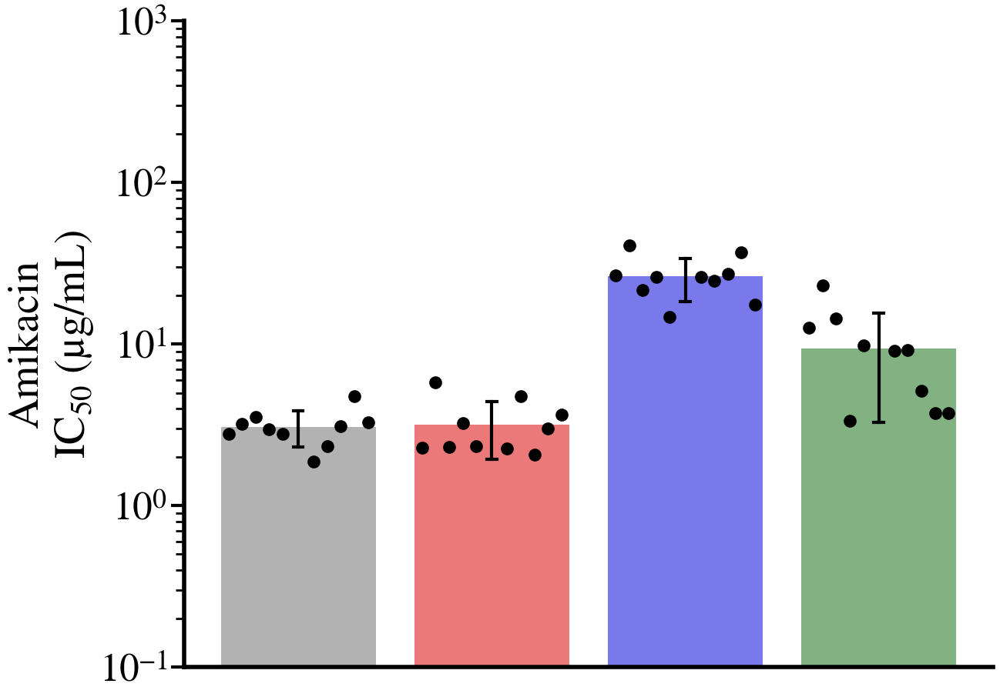

In [65]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

######### NO LABELS
# Assign the antibiotic you want to graph
selected_antibiotic = "Amikacin"

# Subset the data for the selected antibiotic
subset_data = growth_features[growth_features['Antibiotic'] == selected_antibiotic].copy()  # Avoid SettingWithCopyWarning

# Custom y-axis limits for each antibiotic
custom_y_limits = {
    "Levofloxacin": (0.001, 10),
    "Amikacin": (.1, 1000),
    "Cefepime": (0.001, 10)
}

# Create a new column for the updated group labels
def assign_group_label(row):
    if row['group'] == "P":
        return r"MG"  # Just MG
    elif row['group'] == "PLA":
        return r"MG$^{\mathrm{LEV,AMI}}$"  # MG with AMI as superscript
    elif row['group'] == "PLAC":
        return r"MG$^{\mathrm{LEV,AMI,CEF}}$"  # MG with CEF as superscript
    elif row['group'] == "PL":
        return r"MG$^{\mathrm{LEV}}$"  # MG with LEV as superscript
    else:
        return "Unknown"

# Ensure the 'group' column exists
if 'group' not in subset_data.columns:
    subset_data['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])

# Apply the function to create the new column
subset_data.loc[:, 'group_fancy'] = subset_data.apply(assign_group_label, axis=1)

# Update the palette to match the new group labels
group_palette = {
    r"MG": "grey",
    r"MG$^{\mathrm{LEV,AMI}}$": "blue",
    r"MG$^{\mathrm{LEV,AMI,CEF}}$": "forestgreen",
    r"MG$^{\mathrm{LEV}}$": "red",
}

# Use FacetGrid for plotting
g = sns.FacetGrid(
    subset_data,
    col="Antibiotic",  # Facet by Antibiotic
    sharey=False,  # Allow independent y-axis scaling
    height=10,  # Height of each facet
    aspect=1.5,  # Aspect ratio for width scaling
)

# Map bar plots to the grid
g.map(
    sns.barplot,
    "group_fancy",  # X-axis
    "IC50",  # Y-axis
    ci="sd",
    order=subset_data['group_fancy'].unique(),  # Ensure consistent x-axis order
    palette=group_palette,
    alpha=0.6,
    errcolor="black",  # Color of the error bars
    errwidth=3,  # Thickness of the error bars
    capsize=0.05  # Length of the caps on error bars
)

# Custom function to calculate evenly spaced x-positions
def get_evenly_spaced_positions(group_data, x_base, spread=0.36, gap=0.08):
    """
    Calculate evenly spaced x-positions around a central x_base, leaving a gap in the middle.

    Parameters:
        group_data: DataFrame containing points for a single category.
        x_base: Central x position for the category.
        spread: Maximum range to spread points around the center.
        gap: The size of the gap to leave in the middle (default: 0.1).

    Returns:
        List of adjusted x-positions for the points.
    """
    n_points = len(group_data)
    if n_points == 1:
        return [x_base]  # No need to spread if there's only one point

    half_points = n_points // 2  # Divide points into two halves
    if n_points % 2 == 0:
        # Even number of points
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        offsets = np.concatenate([left_offsets, right_offsets])
    else:
        # Odd number of points: one point stays at the center
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        center_offset = [0]  # Keep one point at the exact center
        offsets = np.concatenate([left_offsets, center_offset, right_offsets])

    return x_base + offsets

# Overlay strip plots with custom spacing
for group_fancy, group_data in subset_data.groupby('group_fancy'):
    x_base = subset_data['group_fancy'].unique().tolist().index(group_fancy)  # Base x position
    x_positions = get_evenly_spaced_positions(group_data, x_base)
    
    g.ax.scatter(
        x_positions,
        group_data['IC50'],
        color="black",
        facecolor="black",
        s=100,
        edgecolor="black",
        linewidth=2,
        zorder=10  # Ensure points are above other plot elements
    )


# Customizations for the y-axis and ticks
for ax in g.axes.flat:
    ax.set_yscale("log")  # Set log scale
   # Apply custom y-axis limits for the selected antibiotic
    if selected_antibiotic in custom_y_limits:
        ax.set_ylim(custom_y_limits[selected_antibiotic])
    # Let Seaborn/Matplotlib determine y-ticks automatically and just adjust their font size
    for label in ax.get_yticklabels():
        label.set_fontsize(37)  # Adjust font size for existing tick labels

 

 # Set x-tick positions and labels explicitly
    ax.set_xticks([])  # Remove tick positions
    ax.set_xticklabels([])  # Remove tick labels

    # Remove x-axis label
    ax.set_xlabel('')  # Remove x-axis label
    for spine in ax.spines.values():
        spine.set_linewidth(4)  # Set thickness of the spine lines

    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks


# Add axis labels and facet titles
g.set_axis_labels("", "", fontsize=40)
g.set_axis_labels("", f"{selected_antibiotic}\nIC$_{{50}}$ (μg/mL)", fontsize=40)
g.set_titles("", size=50)  # Facet title uses the column value

# Adjust overall layout and spacing
g.fig.subplots_adjust(left=0.2, right=0.9, top=0.9, wspace=0.3, hspace=0.4)
g.fig.set_size_inches(15, 10)  # Total figure size

# Save the plot (optional)
#g.savefig(f"{selected_antibiotic}_IC50_plot_1127.png", dpi=300, bbox_inches="tight")
g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures'/'finals'/'0512_finals' / f"{selected_antibiotic}_PLAC_IC50.png", dpi=600, bbox_inches="tight")
#g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'Cefepime_IC50_new', dpi=200, bbox_inches='tight')
# Show the plot
plt.show()


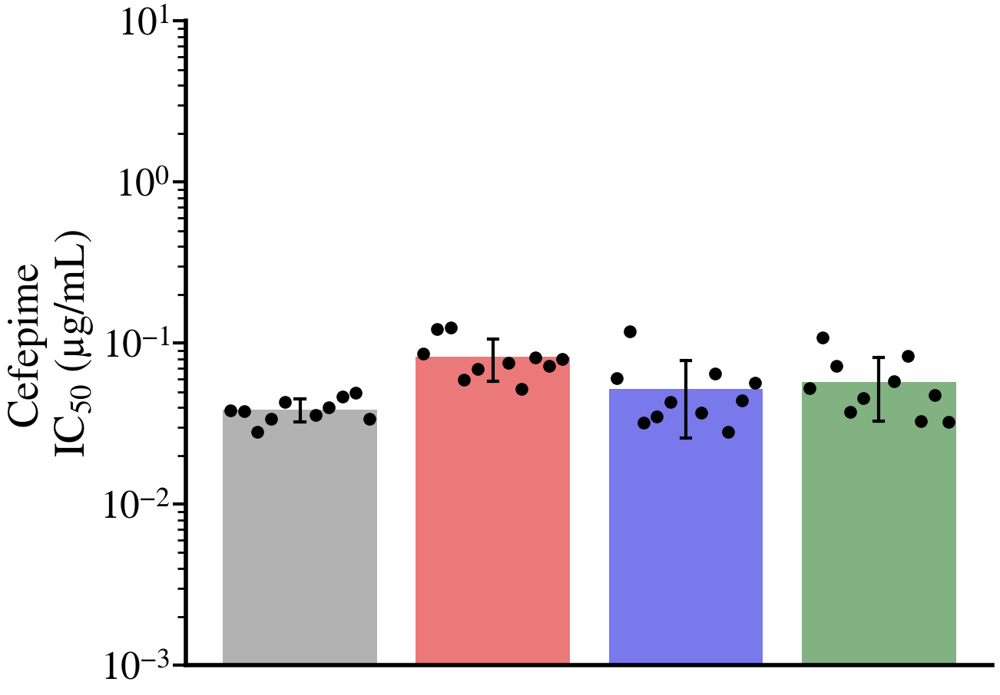

In [66]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "Nimbus Roman"
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Nimbus Roman"

######### NO LABELS
# Assign the antibiotic you want to graph
selected_antibiotic = "Cefepime"

# Subset the data for the selected antibiotic
subset_data = growth_features[growth_features['Antibiotic'] == selected_antibiotic].copy()  # Avoid SettingWithCopyWarning

# Custom y-axis limits for each antibiotic
custom_y_limits = {
    "Levofloxacin": (0.001, 10),
    "Amikacin": (.1, 1000),
    "Cefepime": (0.001, 10)
}

# Create a new column for the updated group labels
def assign_group_label(row):
    if row['group'] == "P":
        return r"MG"  # Just MG
    elif row['group'] == "PLA":
        return r"MG$^{\mathrm{LEV,AMI}}$"  # MG with AMI as superscript
    elif row['group'] == "PLAC":
        return r"MG$^{\mathrm{LEV,AMI,CEF}}$"  # MG with CEF as superscript
    elif row['group'] == "PL":
        return r"MG$^{\mathrm{LEV}}$"  # MG with LEV as superscript
    else:
        return "Unknown"

# Ensure the 'group' column exists
if 'group' not in subset_data.columns:
    subset_data['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])

# Apply the function to create the new column
subset_data.loc[:, 'group_fancy'] = subset_data.apply(assign_group_label, axis=1)

# Update the palette to match the new group labels
group_palette = {
    r"MG": "grey",
    r"MG$^{\mathrm{LEV,AMI}}$": "blue",
    r"MG$^{\mathrm{LEV,AMI,CEF}}$": "forestgreen",
    r"MG$^{\mathrm{LEV}}$": "red",
}

# Use FacetGrid for plotting
g = sns.FacetGrid(
    subset_data,
    col="Antibiotic",  # Facet by Antibiotic
    sharey=False,  # Allow independent y-axis scaling
    height=10,  # Height of each facet
    aspect=1.5,  # Aspect ratio for width scaling
)

# Map bar plots to the grid
g.map(
    sns.barplot,
    "group_fancy",  # X-axis
    "IC50",  # Y-axis
    ci="sd",
    order=subset_data['group_fancy'].unique(),  # Ensure consistent x-axis order
    palette=group_palette,
    alpha=0.6,
    errcolor="black",  # Color of the error bars
    errwidth=3,  # Thickness of the error bars
    capsize=0.05  # Length of the caps on error bars
)

# Custom function to calculate evenly spaced x-positions
def get_evenly_spaced_positions(group_data, x_base, spread=0.36, gap=0.08):
    """
    Calculate evenly spaced x-positions around a central x_base, leaving a gap in the middle.

    Parameters:
        group_data: DataFrame containing points for a single category.
        x_base: Central x position for the category.
        spread: Maximum range to spread points around the center.
        gap: The size of the gap to leave in the middle (default: 0.1).

    Returns:
        List of adjusted x-positions for the points.
    """
    n_points = len(group_data)
    if n_points == 1:
        return [x_base]  # No need to spread if there's only one point

    half_points = n_points // 2  # Divide points into two halves
    if n_points % 2 == 0:
        # Even number of points
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        offsets = np.concatenate([left_offsets, right_offsets])
    else:
        # Odd number of points: one point stays at the center
        left_offsets = np.linspace(-spread, -gap, half_points)
        right_offsets = np.linspace(gap, spread, half_points)
        center_offset = [0]  # Keep one point at the exact center
        offsets = np.concatenate([left_offsets, center_offset, right_offsets])

    return x_base + offsets

# Overlay strip plots with custom spacing
for group_fancy, group_data in subset_data.groupby('group_fancy'):
    x_base = subset_data['group_fancy'].unique().tolist().index(group_fancy)  # Base x position
    x_positions = get_evenly_spaced_positions(group_data, x_base)
    
    g.ax.scatter(
        x_positions,
        group_data['IC50'],
        color="black",
        facecolor="black",
        s=100,
        edgecolor="black",
        linewidth=2,
        zorder=10  # Ensure points are above other plot elements
    )


# Customizations for the y-axis and ticks
for ax in g.axes.flat:
    ax.set_yscale("log")  # Set log scale
    # Apply custom y-axis limits for the selected antibiotic
    if selected_antibiotic in custom_y_limits:
        ax.set_ylim(custom_y_limits[selected_antibiotic])
    # Let Seaborn/Matplotlib determine y-ticks automatically and just adjust their font size
    for label in ax.get_yticklabels():
        label.set_fontsize(37)  # Adjust font size for existing tick labels



 # Set x-tick positions and labels explicitly
    ax.set_xticks([])  # Remove tick positions
    ax.set_xticklabels([])  # Remove tick labels

    # Remove x-axis label
    ax.set_xlabel('')  # Remove x-axis label
    for spine in ax.spines.values():
        spine.set_linewidth(4)  # Set thickness of the spine lines

    ax.tick_params(axis='both', which='major', length=12, width=3)  # Major ticks
    ax.tick_params(axis='both', which='minor', length=8, width=2)  # Minor ticks


# Add axis labels and facet titles
g.set_axis_labels("", "", fontsize=40)
g.set_axis_labels("", f"{selected_antibiotic}\nIC$_{{50}}$ (μg/mL)", fontsize=40)
g.set_titles("", size=50)  # Facet title uses the column value

# Adjust overall layout and spacing
g.fig.subplots_adjust(left=0.2, right=0.9, top=0.9, wspace=0.3, hspace=0.4)
g.fig.set_size_inches(15, 10)  # Total figure size

# Save the plot (optional)
#g.savefig(f"{selected_antibiotic}_IC50_plot_1127.png", dpi=300, bbox_inches="tight")
g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures'/'finals'/'0512_finals' / f"{selected_antibiotic}_PLAC_IC50.png", dpi=600, bbox_inches="tight")
#g.fig.savefig(PROJECT_PATH / PROJECT_ID / 'figures' / f'Cefepime_IC50_new', dpi=200, bbox_inches='tight')
# Show the plot
plt.show()


In [34]:
import pandas as pd
import itertools
import re
from scipy.stats import ttest_rel

# Assuming growth_features DataFrame is already defined
# Step 1: Create the 'group' and 'culturenumber' columns
growth_features['group'] = growth_features['Strain'].apply(lambda x: re.split(r'[1-9]', x)[0])
growth_features['culturenumber'] = growth_features['Strain'].apply(lambda x: re.search(r'(\d+)', x).group() if re.search(r'(\d+)', x) else None)

# Step 2: Initialize an empty list to store results and get all unique pairs of groups
unique_groups = growth_features['group'].unique()
group_pairs = list(itertools.combinations(unique_groups, 2))  # Generate all unique pairs of groups

# Step 3: Perform paired t-tests for each unique pair of groups within each antibiotic
results = []
for antibiotic in growth_features['Antibiotic'].unique():
    # Filter data by antibiotic
    antibiotic_data = growth_features[growth_features['Antibiotic'] == antibiotic]
    
    for group1, group2 in group_pairs:
        # Filter data for each group
        data1 = antibiotic_data[antibiotic_data['group'] == group1]
        data2 = antibiotic_data[antibiotic_data['group'] == group2]
        
        # Find common culture numbers by using set intersection
        common_culturenumbers = set(data1['culturenumber']).intersection(set(data2['culturenumber']))
        data1_common = data1[data1['culturenumber'].isin(common_culturenumbers)].set_index('culturenumber')
        data2_common = data2[data2['culturenumber'].isin(common_culturenumbers)].set_index('culturenumber')
        
        # Ensure paired data has matching indices (culturenumber)
        if not data1_common.empty and not data2_common.empty:
            ic50_group1 = data1_common['IC50']
            ic50_group2 = data2_common['IC50']
            
            # Perform paired t-test
            t_stat, p_value = ttest_rel(ic50_group1, ic50_group2)
            
            # Append results to list
            results.append({
                'Antibiotic': antibiotic,
                'Group1': group1,
                'Group2': group2,
                't_stat': t_stat,
                'p_value': p_value
            })

# Step 4: Convert results into a DataFrame
sig_growth_features = pd.DataFrame(results)

# Display or save the results
sig_growth_features # Print to check if results are populated


,Antibiotic,Group1,Group2,t_stat,p_value
0,Levofloxacin,P,PL,-7.937193,0.000024
1,Levofloxacin,P,PLA,-4.288740,0.002024
2,Levofloxacin,P,PLAC,-4.048402,0.002892
3,Levofloxacin,PL,PLA,3.677300,0.005097
4,Levofloxacin,PL,PLAC,2.544634,0.031471
5,Levofloxacin,PLA,PLAC,-1.100455,0.299695
6,Amikacin,P,PL,-0.221086,0.829960
7,Amikacin,P,PLA,-9.637648,0.000005
8,Amikacin,P,PLAC,-3.177143,0.011236
9,Amikacin,PL,PLA,-9.911805,0.000004


In [35]:
import pandas as pd

# Step 1: Calculate the mean IC50 for each combination of Antibiotic and group
group_means = growth_features.groupby(['Antibiotic', 'group'])['IC50'].mean().reset_index()
group_means = group_means.rename(columns={'IC50': 'mean_IC50'})

# Step 2: Merge the means for Group1 and Group2 into sig_growth_features
sig_growth_features = sig_growth_features.merge(
    group_means, left_on=['Antibiotic', 'Group1'], right_on=['Antibiotic', 'group'], how='left'
).rename(columns={'mean_IC50': 'mean_IC50_Group1'}).drop(columns='group')

sig_growth_features = sig_growth_features.merge(
    group_means, left_on=['Antibiotic', 'Group2'], right_on=['Antibiotic', 'group'], how='left'
).rename(columns={'mean_IC50': 'mean_IC50_Group2'}).drop(columns='group')

# Display the filtered DataFrame
sig_growth_features

,Antibiotic,Group1,Group2,t_stat,p_value,mean_IC50_Group1,mean_IC50_Group2
0,Levofloxacin,P,PL,-7.937193,0.000024,0.036634,1.374045
1,Levofloxacin,P,PLA,-4.288740,0.002024,0.036634,0.614716
2,Levofloxacin,P,PLAC,-4.048402,0.002892,0.036634,0.754383
3,Levofloxacin,PL,PLA,3.677300,0.005097,1.374045,0.614716
4,Levofloxacin,PL,PLAC,2.544634,0.031471,1.374045,0.754383
5,Levofloxacin,PLA,PLAC,-1.100455,0.299695,0.614716,0.754383
6,Amikacin,P,PL,-0.221086,0.829960,3.072001,3.173507
7,Amikacin,P,PLA,-9.637648,0.000005,3.072001,26.228007
8,Amikacin,P,PLAC,-3.177143,0.011236,3.072001,9.420465
9,Amikacin,PL,PLA,-9.911805,0.000004,3.173507,26.228007


In [26]:
summary_stats = (
    growth_features.groupby(['group', 'Antibiotic'])
    .agg(mean_IC50=('IC50', 'mean'), sd_IC50=('IC50', 'std'))
    .reset_index()
)
summary_stats

,group,Antibiotic,mean_IC50,sd_IC50
0,P,Amikacin,3.072001,0.771780
1,P,Cefepime,0.038663,0.006385
2,P,Levofloxacin,0.036634,0.009053
3,PL,Amikacin,3.173507,1.247111
4,PL,Cefepime,0.082337,0.024199
5,PL,Levofloxacin,1.374045,0.530789
6,PLA,Amikacin,26.228007,7.863665
7,PLA,Cefepime,0.051923,0.026288
8,PLA,Levofloxacin,0.614716,0.425567
9,PLAC,Amikacin,9.420465,6.151592
